In [1]:
from fastai.vision.all import *
from fastcore.parallel import *
import timm
import gc
import plotly.express as px
from scipy.special import softmax, log_softmax

In [2]:
path = Path('paddy-disease-classification')

train_path = path / 'train_images'
train_files = get_image_files(train_path)

test_path = path/'test_images'
test_files = get_image_files(test_path).sorted()

sample_submission = pd.read_csv(path/'sample_submission.csv')

In [3]:
train_df = pd.read_csv(path / 'train.csv')
train_df.sample(10)

,image_id,label,variety,age
3877,110085.jpg,brown_spot,KarnatakaPonni,75
5211,108811.jpg,dead_heart,Onthanel,50
6126,104986.jpg,hispa,ADT45,50
7316,101235.jpg,hispa,KarnatakaPonni,50
4092,110031.jpg,dead_heart,ADT45,67
9900,101371.jpg,tungro,ADT45,70
9975,104063.jpg,tungro,ADT45,70
6895,105689.jpg,hispa,AndraPonni,65
9144,104019.jpg,normal,Ponni,60
7352,100072.jpg,hispa,KarnatakaPonni,70


In [4]:
train_df.label.value_counts()

normal                      1764
blast                       1738
hispa                       1594
dead_heart                  1442
tungro                      1088
brown_spot                   965
downy_mildew                 620
bacterial_leaf_blight        479
bacterial_leaf_streak        380
bacterial_panicle_blight     337
Name: label, dtype: int64

In [5]:
train_df.variety.value_counts()

ADT45             6992
KarnatakaPonni     988
Ponni              657
AtchayaPonni       461
Zonal              399
AndraPonni         377
Onthanel           351
IR20               114
RR                  36
Surya               32
Name: variety, dtype: int64

Images that are rotated:
- 
- 
- 
- 

In [6]:
def f(o): 
    size = PILImage.create(o).size
    
    if size == (640, 480):
        print(o)
    
    return PILImage.create(o).size

train_sizes = parallel(f, train_files, n_workers=8)
test_sizes = parallel(f, test_files, n_workers=8)

paddy-disease-classification/train_images/bacterial_leaf_blight/100622.jpg
paddy-disease-classification/train_images/bacterial_leaf_blight/103734.jpg
paddy-disease-classification/train_images/brown_spot/103050.jpg
paddy-disease-classification/train_images/brown_spot/103343.jpg
paddy-disease-classification/test_images/200533.jpg
paddy-disease-classification/test_images/200916.jpg


## Resnet34
### item_tfms=Resize((640,480))

In [57]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize((640,480)),
    #item_tfms=Resize((640,480), method=ResizeMethod.Pad, pad_mode=PadMode.Zeros),
    # size = 128 for faster training
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)

In [65]:
dls = dblock.dataloaders(train_path)

test_dl = dls.test_dl(test_files)
valid_dl = dls.valid

In [60]:
learn = vision_learner(dls, resnet34, metrics=error_rate).to_fp16()

In [61]:
learn.fine_tune(16, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.790306,1.028048,0.328208,03:07


epoch,train_loss,valid_loss,error_rate,time
0,0.802541,0.472755,0.148006,03:35
1,0.489150,0.376918,0.113407,03:32
2,0.409948,0.362615,0.111485,03:22
3,0.365255,0.339133,0.095147,03:37
4,0.345225,0.340805,0.098510,03:28
5,0.288650,0.279640,0.085536,03:23
6,0.225706,0.260952,0.066314,03:39
7,0.195660,0.173558,0.053820,03:25
8,0.146822,0.253659,0.068717,03:28
9,0.127933,0.193591,0.049495,03:28


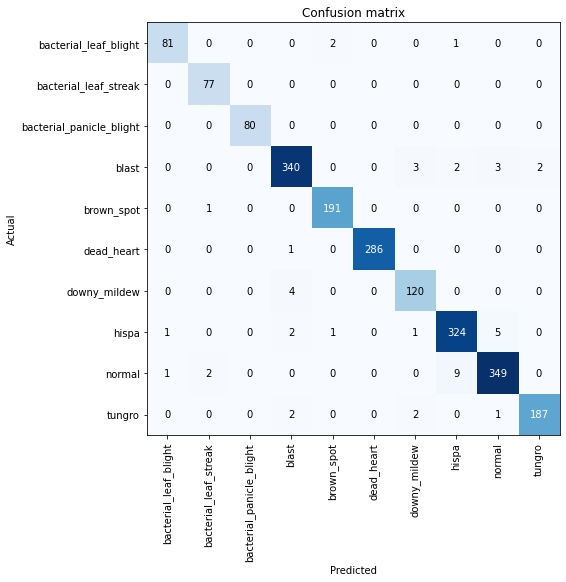

In [107]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

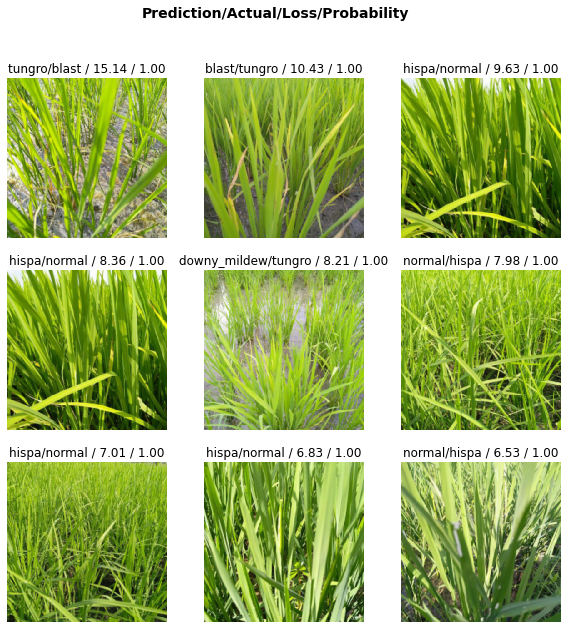

In [106]:
interp.plot_top_losses(9, figsize=(10,10))

In [124]:
val_probs, target = learn.get_preds(dl=learn.dls.valid)
error_rate(val_probs, target)

TensorBase(0.0221)

In [125]:
test_dl = learn.dls.test_dl(test_files)

In [126]:
probs, _, idxs = learn.get_preds(dl=test_dl, with_decoded=True)
idxs

TensorBase([7, 8, 3,  ..., 8, 1, 5])

In [70]:
all( probs.argmax(dim=1) == idxs )

True

In [127]:
vocab

array(['bacterial_leaf_blight', 'bacterial_leaf_streak',
       'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart',
       'downy_mildew', 'hispa', 'normal', 'tungro'], dtype='<U24')

In [128]:
pd.Series(vocab[idxs]).value_counts()

normal                      583
blast                       573
hispa                       540
dead_heart                  481
tungro                      366
brown_spot                  320
downy_mildew                199
bacterial_leaf_blight       165
bacterial_leaf_streak       132
bacterial_panicle_blight    110
dtype: int64

In [129]:
preds, _ = learn.tta(dl=test_dl)

In [130]:
pd.Series(vocab[preds.argmax(dim=1)]).value_counts()

normal                      586
blast                       577
hispa                       542
dead_heart                  478
tungro                      365
brown_spot                  317
downy_mildew                196
bacterial_leaf_blight       165
bacterial_leaf_streak       130
bacterial_panicle_blight    113
dtype: int64

In [131]:
preds.amax(dim=1)

TensorBase([1.0000, 0.9995, 0.9971,  ..., 1.0000, 1.0000, 1.0000])

In [132]:
preds[0]

TensorBase([2.5618e-06, 2.8483e-08, 6.5595e-09, 1.8770e-09, 5.8452e-08, 6.0944e-09,
        3.3103e-08, 1.0000e+00, 8.0630e-08, 4.1895e-09])

In [133]:
probs.amax(dim=1)

TensorBase([1.0000, 0.9997, 1.0000,  ..., 1.0000, 1.0000, 1.0000])

In [134]:
sum( probs.argmax(dim=1) != preds.argmax(dim=1) )

TensorBase(28)

In [136]:
sample_submission.label = vocab[probs.argmax(dim=1)]
sample_submission

,image_id,label
0,200001.jpg,hispa
1,200002.jpg,normal
2,200003.jpg,blast
3,200004.jpg,blast
4,200005.jpg,blast
...,...,...
3464,203465.jpg,dead_heart
3465,203466.jpg,hispa
3466,203467.jpg,normal
3467,203468.jpg,bacterial_leaf_streak


In [137]:
sample_submission.to_csv('22jul02-moreresnet34-notta.csv', index=False)

Kaggle: 0.97808

In [138]:
sample_submission.label = vocab[preds.argmax(dim=1)]
sample_submission

,image_id,label
0,200001.jpg,hispa
1,200002.jpg,normal
2,200003.jpg,blast
3,200004.jpg,blast
4,200005.jpg,blast
...,...,...
3464,203465.jpg,dead_heart
3465,203466.jpg,hispa
3466,203467.jpg,normal
3467,203468.jpg,bacterial_leaf_streak


In [139]:
sample_submission.to_csv('22jul02-moreresnet34-tta.csv', index=False)

Kaggle: 0.98193

In [157]:
model_01_preds = {
    'vocab': vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul02_model_01_preds_dict.pkl', model_01_preds)

## Resnet50
### item_tfms=Resize(480, method='squish'),

In [158]:
gc.collect()
torch.cuda.empty_cache()

In [5]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    # size = 128 for faster training
    batch_tfms=aug_transforms(size=224, min_scale=0.75),
)

In [6]:
dls = dblock.dataloaders(train_path, bs=32)

test_dl = dls.test_dl(test_files)
valid_dl = dls.valid

In [7]:
cbs = GradientAccumulation(64)
learn = vision_learner(dls, resnet50, metrics=error_rate, cbs=cbs).to_fp16()

In [8]:
learn.fine_tune(20, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.414213,0.925458,0.294089,02:10


epoch,train_loss,valid_loss,error_rate,time
0,0.675108,0.416728,0.126382,01:58
1,0.404115,0.300788,0.100913,01:56
2,0.366500,0.332998,0.097069,01:57
3,0.380665,0.279969,0.089380,01:59
4,0.373602,0.280511,0.083614,01:56
5,0.297880,0.285265,0.085536,01:54
6,0.286434,0.237180,0.074964,01:52
7,0.248082,0.224666,0.067756,01:51
8,0.238576,0.227773,0.060548,01:52
9,0.192720,0.198901,0.052859,01:51


In [19]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))
probs

TensorBase([[1.1399e-06, 7.6580e-09, 9.0247e-08,  ..., 9.9998e-01, 9.2567e-08,
         7.7042e-08],
        [3.0860e-07, 2.6939e-08, 6.7272e-07,  ..., 2.1189e-07, 9.9998e-01,
         1.0910e-05],
        [2.9796e-08, 1.3434e-06, 4.3097e-05,  ..., 5.1490e-07, 2.0358e-05,
         5.1684e-08],
        ...,
        [5.0230e-08, 1.2428e-06, 2.6642e-07,  ..., 2.7207e-07, 1.0000e+00,
         1.4572e-06],
        [2.8527e-05, 9.9922e-01, 2.5493e-06,  ..., 8.3356e-05, 2.4628e-05,
         2.6513e-05],
        [5.5772e-09, 1.2698e-09, 4.1917e-09,  ..., 1.0381e-08, 1.7615e-08,
         1.3544e-09]])

In [20]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [21]:
dls.vocab[probs.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [22]:
dls.vocab[preds.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [23]:
model_02_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul02_model_02_preds_dict.pkl', model_02_preds)

In [24]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul02-moreresnet50-notta.csv', index=False)

Looked good locally, but on Kaggle returned 0.98193

In [25]:
sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul02-moreresnet50-tta.csv', index=False)

Same with tta, but a little better: 0.98231

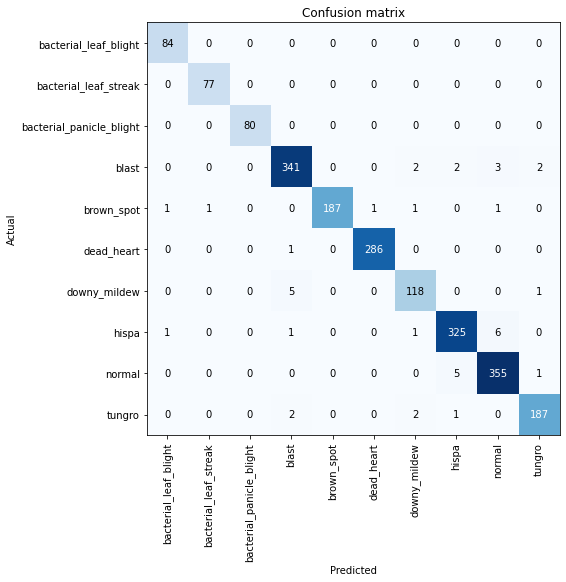

In [26]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

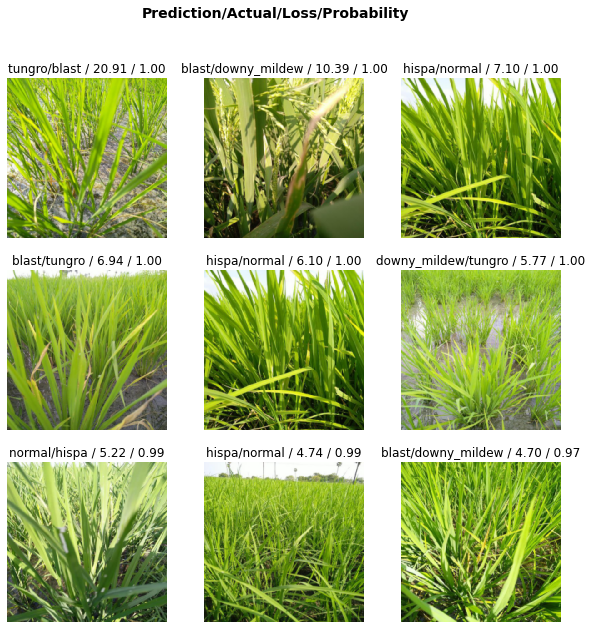

In [27]:
interp.plot_top_losses(9, figsize=(10,10))

## Resnet50
What about trying resnet50 with another seed...

In [5]:
## SEED = 48

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=48),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75),
)

In [6]:
dls = dblock.dataloaders(train_path, bs=32)

In [7]:
cbs = GradientAccumulation(64)
learn = vision_learner(dls, resnet50, metrics=error_rate, cbs=cbs).to_fp16()

In [8]:
learn.fine_tune(20, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.412833,0.890576,0.302739,01:45


epoch,train_loss,valid_loss,error_rate,time
0,0.641466,0.377945,0.111485,01:55
1,0.377951,0.302258,0.089861,01:53
2,0.372037,0.314619,0.094666,01:58
3,0.408679,0.357733,0.102835,05:05
4,0.406548,0.305416,0.093705,05:49
5,0.339406,0.318188,0.090822,05:59
6,0.285607,0.313814,0.086497,05:42
7,0.231679,0.222970,0.063912,05:50
8,0.220398,0.200839,0.060067,05:33
9,0.184058,0.175605,0.048534,05:41


In [11]:
test_dl = dls.test_dl(test_files)

probs, _ = learn.get_preds(dl=test_dl)


In [12]:
valid_probs, target = learn.get_preds(dl=dls.valid)
error_rate(valid_probs, target)

TensorBase(0.0231)

In [13]:
preds, _ = learn.tta(dl=test_dl)

In [14]:
model_03_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul03_model_03_preds_dict.pkl', model_03_preds)

In [15]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul03-moreresnet50-seed48-notta.csv', index=False)

In [16]:
sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul03-moreresnet50-seed48-tta.csv', index=False)

In [17]:
gc.collect()
torch.cuda.empty_cache()

## vit_large_patch16_224

In [5]:
gc.collect()
torch.cuda.empty_cache()

In [6]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=70),
    item_tfms=Resize(480),
    batch_tfms=aug_transforms(size=224, min_scale=0.75),
)

In [7]:
dls = dblock.dataloaders(train_path, bs=4)

In [8]:
arch = 'vit_large_patch16_224'
cbs = GradientAccumulation(64)

learn = vision_learner(dls, arch, metrics=error_rate, cbs=cbs).to_fp16()

In [9]:
learn.fine_tune(20, 0.0075)

epoch,train_loss,valid_loss,error_rate,time
0,1.434493,0.867418,0.287362,12:13


epoch,train_loss,valid_loss,error_rate,time
0,1.118985,0.594997,0.188852,16:26
1,0.831241,0.500127,0.165786,16:28
2,0.756885,0.378916,0.124459,16:21
3,0.993695,0.482717,0.147045,16:25
4,0.699863,0.404112,0.138395,16:28
5,0.818296,0.571011,0.180682,16:25
6,0.550917,0.257083,0.078328,16:24
7,0.417462,0.256937,0.074003,16:27
8,0.428308,0.250110,0.077847,16:29
9,0.235606,0.173598,0.053340,16:38


In [10]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))
probs

TensorImage([[2.1632e-04, 3.5869e-05, 2.1502e-05,  ..., 9.9483e-01, 3.5082e-03,
         5.0386e-05],
        [5.4699e-04, 7.1627e-05, 5.0396e-05,  ..., 5.1763e-04, 9.9503e-01,
         8.5359e-04],
        [4.1941e-07, 3.4303e-06, 1.0503e-06,  ..., 2.0761e-04, 3.1426e-04,
         2.7118e-04],
        ...,
        [3.3620e-05, 9.8141e-05, 1.3610e-05,  ..., 4.2454e-04, 9.9649e-01,
         1.5561e-04],
        [2.4869e-07, 9.9997e-01, 3.0406e-08,  ..., 4.6190e-07, 1.0480e-06,
         1.7560e-06],
        [2.4567e-05, 7.3036e-07, 9.0376e-05,  ..., 9.6226e-05, 1.6035e-04,
         1.9257e-04]])

In [11]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [12]:
dls.vocab[probs.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [13]:
dls.vocab[preds.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [14]:
model_04_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul04_model_04_preds_dict.pkl', model_04_preds)

In [15]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul04-model4-vit-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul04-model4-vit-tta.csv', index=False)

## Model 5 swinv2_base_patch4_window12_192_22k.pth

In [21]:
! ls /home/fmussari/.cache/torch/hub/checkpoints/

L_16-i21k-300ep-lr_0.001-aug_medium1-wd_0.1-do_0.1-sd_0.1--imagenet2012-steps_20k-lr_0.01-res_224.npz
convnext_small_22k_224.pth
convnext_tiny_22k_224.pth
resnet18-5c106cde.pth
resnet18-f37072fd.pth
resnet34-43635321.pth
resnet34-b627a593.pth
resnet50-0676ba61.pth
resnet50_a1_0-14fe96d1.pth
swinv2_base_patch4_window12_192_22k.pth


In [7]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=70),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=192, min_scale=0.75),
)

In [8]:
dls = dblock.dataloaders(train_path, bs=32)

In [20]:
arch = 'swinv2_base_window12_192_22k'
cbs = GradientAccumulation(64)

learn = vision_learner(dls, arch, metrics=error_rate, cbs=cbs).to_fp16()

/home/fmussari/mambaforge/envs/fastaiv3/lib/python3.9/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /home/conda/feedstock_root/build_artifacts/pytorch-recipe_1650965732461/work/aten/src/ATen/native/TensorShape.cpp:2227.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [21]:
learn.fine_tune(20, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.270788,0.822564,0.274387,04:20


epoch,train_loss,valid_loss,error_rate,time
0,0.680548,0.418792,0.140798,07:05
1,0.474301,0.329970,0.107641,07:35
2,0.400549,0.240221,0.079769,07:11
3,0.310898,0.230651,0.070159,06:48
4,0.261354,0.203687,0.063912,06:27
5,0.240072,0.187873,0.049976,07:09
6,0.226183,0.181859,0.053820,06:54
7,0.180743,0.163563,0.052859,07:24
8,0.148993,0.131410,0.033157,07:22
9,0.112231,0.122032,0.029793,07:13


- Empezó training a la 9:53 pm con Profile 4 de MSI Afterburner
- A las 11_08 se colocó el perfil 3, empezando el epoch 10 (Power 80%)
- A las 11:37 le bajé el power a 80%, terminando epoch 13

In [22]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

In [23]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [24]:
dls.vocab[probs.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [25]:
dls.vocab[preds.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [26]:
model_05_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul04_model_05_preds_dict.pkl', model_05_preds)

In [27]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul04-model5-swinv2-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul04-model5-swinv2-tta.csv', index=False)

## Model 06. swinv2_base_patch4_window12_192_22k.pth
- Seed=42

In [5]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=192, min_scale=0.75),
)

In [6]:
dls = dblock.dataloaders(train_path, bs=32)

In [7]:
arch = 'swinv2_base_window12_192_22k'
cbs = GradientAccumulation(64)

learn = vision_learner(dls, arch, metrics=error_rate, cbs=cbs).to_fp16()

/home/fmussari/mambaforge/envs/fastaiv3/lib/python3.9/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /home/conda/feedstock_root/build_artifacts/pytorch-recipe_1650965732461/work/aten/src/ATen/native/TensorShape.cpp:2227.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [8]:
learn.fine_tune(20, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.276483,0.737066,0.242672,04:19


epoch,train_loss,valid_loss,error_rate,time
0,0.691163,0.391754,0.132148,08:14
1,0.484487,0.286344,0.095627,06:16
2,0.403297,0.268277,0.087938,06:53
3,0.323062,0.282729,0.081691,05:37
4,0.283866,0.214296,0.066795,05:30
5,0.267512,0.198304,0.058626,05:30
6,0.203537,0.183031,0.050457,05:31
7,0.163706,0.143751,0.039404,05:30
8,0.170011,0.129934,0.035560,05:30
9,0.107734,0.143736,0.033157,05:30


In [9]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

In [10]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [11]:
dls.vocab[probs.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [12]:
dls.vocab[preds.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

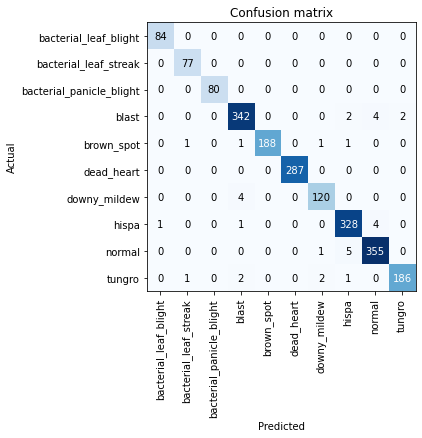

In [13]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(6,6))

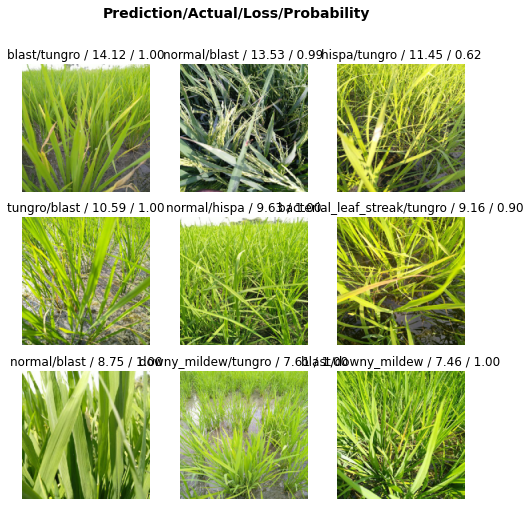

In [15]:
interp.plot_top_losses(9, figsize=(8, 8))

In [21]:
interp.top_losses()

(TensorBase([14.1221, 13.5299, 11.4489,  ..., -0.0000, -0.0000, -0.0000]),
 TensorBase([ 638,  124,  905,  ...,  370, 1476,  575]))

In [14]:
model_06_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul05_model_06_preds_dict.pkl', model_06_preds)

In [16]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul05-model6-swinv2-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul05-model6-swinv2-tta.csv', index=False)

In [19]:
valid_names = [each.name for each in dls.valid.items]
#valid_names

## Model 07 - convnext with Multi Output

In [5]:
gc.collect()
torch.cuda.empty_cache()

In [6]:
labels = { r.image_id: r.label for _, r in train_df.iterrows() }

def custom_labeling(p, labels=labels):
    out = f'no_{label}'
    if labels[p.name] == label: out = label
    return out

In [7]:
label = 'normal'

dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock, CategoryBlock),
    n_inp=1,
    get_items=get_image_files,
    get_y = [parent_label, custom_labeling],
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(224, method='squish'),
    batch_tfms=aug_transforms(size=128, min_scale=0.75)
).dataloaders(train_path, bs=32)

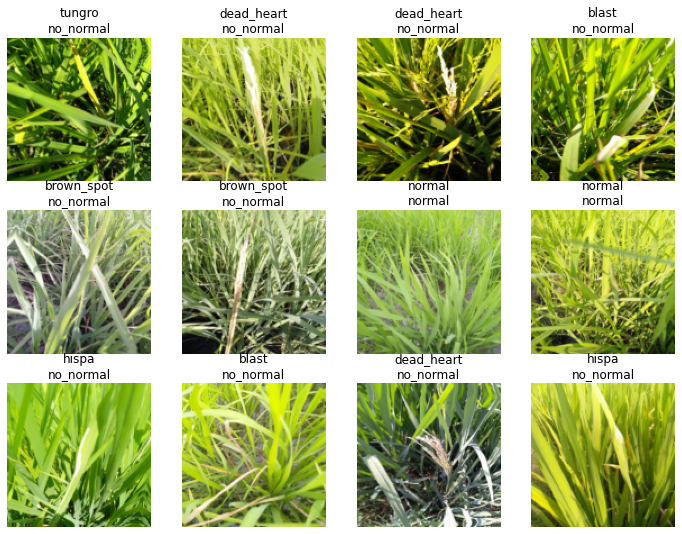

In [8]:
dls.show_batch(max_n=12)

In [9]:
def disease_loss(inp, disease, custom_labeling): 
    return F.cross_entropy(inp[:, :10], disease)

def custom_labeling_loss(inp, disease, custom_labeling): 
    return F.cross_entropy(inp[:, 10:], custom_labeling)

def combine_loss(inp, disease, custom_labeling): 
    return disease_loss(inp, disease, custom_labeling) + custom_labeling_loss(inp, disease, custom_labeling)

def disease_err(inp, disease, custom_labeling): 
    return error_rate(inp[:, :10], disease)

def custom_labeling_err(inp, disease, custom_labeling): 
    return error_rate(inp[:, 10:], custom_labeling)

err_metrics = (disease_err, custom_labeling_err)

all_metrics = err_metrics + (disease_loss, custom_labeling_loss)

In [10]:
timm.list_models("convnext_tin*")

['convnext_tiny',
 'convnext_tiny_384_in22ft1k',
 'convnext_tiny_hnf',
 'convnext_tiny_hnfd',
 'convnext_tiny_in22ft1k',
 'convnext_tiny_in22k']

In [11]:
cbs = GradientAccumulation(64)

learn = vision_learner(
    dls, "convnext_tiny_in22k", 
    loss_func=combine_loss, metrics=all_metrics, n_out=12, 
    cbs=cbs
).to_fp16()

In [12]:
learn.fine_tune(18, 0.01)

epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,1.590958,1.170139,0.316194,0.079769,0.957005,0.213134,01:42


epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,0.877927,0.698411,0.182605,0.042287,0.573371,0.125041,01:57
1,0.688750,0.511182,0.134070,0.029793,0.426143,0.085039,01:51
2,0.614333,0.439392,0.111004,0.026910,0.356740,0.082652,01:45
3,0.522708,0.441383,0.111004,0.032196,0.342668,0.098715,01:44
4,0.487590,0.432269,0.098991,0.033157,0.334167,0.098102,01:44
5,0.396044,0.333930,0.077367,0.023066,0.255468,0.078463,01:44
6,0.345106,0.232455,0.049015,0.017299,0.180435,0.052020,01:46
7,0.261945,0.287018,0.061028,0.018741,0.220406,0.066612,01:45
8,0.248638,0.261297,0.052859,0.018741,0.192630,0.068666,01:45
9,0.192099,0.247555,0.049495,0.012494,0.191205,0.056350,01:44


In [ ]:
#interp = ClassificationInterpretation.from_learner(learn)

In [22]:
dls.vocab[0]

['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']

In [14]:
probs, _ = learn.get_preds(dl=dls.valid)

In [15]:
probs

TensorBase([[ -3.8379, -13.1328,  -6.7617,  ...,   1.2617,   9.9453, -10.3203],
        [ -3.8340,  -4.6172,  -3.4238,  ...,  -4.1055,  -5.6758,   6.6055],
        [ -3.4727,  12.7891,  -7.7500,  ...,   0.1886,  12.2500, -10.7969],
        ...,
        [ 12.4531,  -0.3843,  -2.8594,  ...,  -3.7656,   6.9727,  -5.3828],
        [  0.7871, -14.5156,  -6.9805,  ...,  14.8359,  11.6172, -13.1953],
        [ -2.8379,  -3.6855, -10.2031,  ...,  -4.1719,  12.2812, -12.6953]])

In [29]:
probs[:, :10][0]

TensorBase([ -4.5273, -10.1484,  -6.6680,  -5.7188,  -7.0195, -10.6953,  -7.0508,
         12.2656,  -6.8047,  -5.2500])

In [35]:
error_rate(probs[:,:10], _[0])

TensorBase(0.0250)

In [30]:
learn.get_preds??

In [36]:
error_rate(probs[:, 10:], _[1])

TensorBase(0.0096)

In [37]:
probs, target, decoded = learn.get_preds(dl=dls.valid, with_decoded=True)

In [38]:
probs[:, :10]

TensorBase([[ -4.5273, -10.1484,  -6.6680,  ...,  12.2656,  -6.8047,  -5.2500],
        [ -1.9668,  -4.0234,  -2.1719,  ...,  -1.3672,  12.0859,  -2.3184],
        [ -4.0234,   8.7891,  -6.5469,  ...,  -3.5645,  -7.7070,  -1.0957],
        ...,
        [  9.3359,  -4.0859,  -8.2109,  ...,  -1.9600,  -5.3359,   0.1827],
        [ -3.4609,  -7.7109, -10.5234,  ...,  -6.2422,  -5.0664,  10.8750],
        [ -6.8516,  -4.3281,  -7.2031,  ...,  -6.2539,  -5.2773,  -4.2930]])

In [40]:
decoded[:, :10]

TensorBase([[ -4.5273, -10.1484,  -6.6680,  ...,  12.2656,  -6.8047,  -5.2500],
        [ -1.9668,  -4.0234,  -2.1719,  ...,  -1.3672,  12.0859,  -2.3184],
        [ -4.0234,   8.7891,  -6.5469,  ...,  -3.5645,  -7.7070,  -1.0957],
        ...,
        [  9.3359,  -4.0859,  -8.2109,  ...,  -1.9600,  -5.3359,   0.1827],
        [ -3.4609,  -7.7109, -10.5234,  ...,  -6.2422,  -5.0664,  10.8750],
        [ -6.8516,  -4.3281,  -7.2031,  ...,  -6.2539,  -5.2773,  -4.2930]])

In [39]:
error_rate(probs[:,:10], target[0])

TensorBase(0.0250)

In [19]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

In [20]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [23]:
sample_submission.label = dls.vocab[0][probs[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul08-model7-multiconvnext-notta.csv', index=False)

sample_submission.label = dls.vocab[0][preds[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul08-model7-multiconvnext-tta.csv', index=False)

## Model 08 - convnext 

```
nvidia-smi --query-gpu=timestamp,power.draw,power.limit,memory.total,utilization.memory,temperature.gpu,clocks.current.graphics,clocks.current.sm,clocks.current.memory --loop=15 --format=csv --filename=220708-model8-convnext_tiny_in22k.csv
```

In [6]:
gc.collect()
torch.cuda.empty_cache()

dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    n_inp=1,
    get_items=get_image_files,
    get_y = parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
).dataloaders(train_path, bs=32)

In [7]:
cbs = GradientAccumulation(64)

learn = vision_learner(
    dls, "convnext_tiny_in22k", 
    metrics=error_rate, 
    cbs=cbs
).to_fp16()

In [8]:
learn.fine_tune(36, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.159218,0.634310,0.211437,03:20


epoch,train_loss,valid_loss,error_rate,time
0,0.646530,0.409675,0.134070,03:40
1,0.490958,0.310626,0.099471,03:38
2,0.398838,0.261795,0.079769,03:49
3,0.371761,0.221834,0.074483,03:53
4,0.303414,0.216954,0.068236,03:52
5,0.274977,0.181582,0.052859,03:50
6,0.262570,0.187791,0.051898,03:50
7,0.247259,0.198436,0.053820,03:50
8,0.220007,0.192915,0.054781,03:50
9,0.209435,0.174769,0.052859,03:50


In [9]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [10]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul08-model8-convnext-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul08-model8-convnext-tta.csv', index=False)

In [11]:
model_08_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul08_model_08_preds_dict.pkl', model_08_preds)

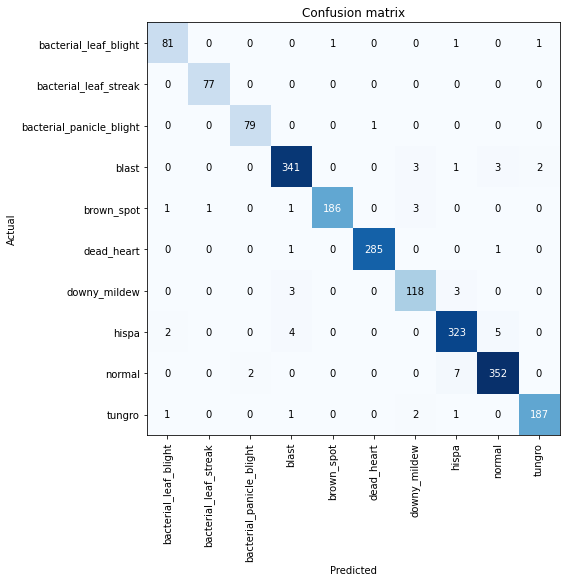

In [12]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

## Model 09. Resnet34 Multioutput

In [6]:
gc.collect()
torch.cuda.empty_cache()

In [7]:
labels = { r.image_id: r.label for _, r in train_df.iterrows() }

def custom_labeling(p, labels=labels):
    out = f'no_{label}'
    if labels[p.name] == label: out = label
    return out

In [17]:
label = 'normal'

dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock, CategoryBlock),
    n_inp=1,
    get_items=get_image_files,
    get_y = [parent_label, custom_labeling],
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
).dataloaders(train_path, bs=32)

In [18]:
dls.vocab

(#2) [['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro'],['no_normal', 'normal']]

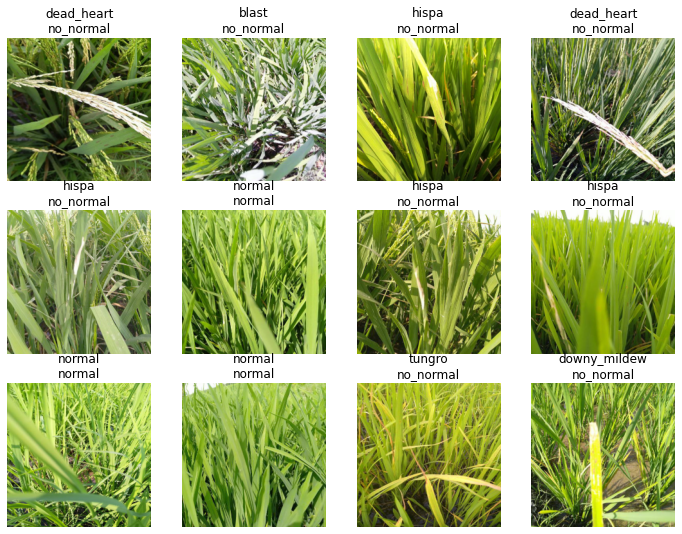

In [19]:
dls.show_batch(max_n=12)

In [20]:
def disease_loss(inp, disease, custom_labeling): return F.cross_entropy(inp[:, :10], disease)

def custom_labeling_loss(inp, disease, custom_labeling): return F.cross_entropy(inp[:, 10:], custom_labeling)

def combine_loss(inp, disease, custom_labeling): return disease_loss(inp, disease, custom_labeling) + custom_labeling_loss(inp, disease, custom_labeling)

def disease_err(inp, disease, custom_labeling): return error_rate(inp[:, :10], disease)

def custom_labeling_err(inp, disease, custom_labeling): return error_rate(inp[:, 10:], custom_labeling)

err_metrics = (disease_err, custom_labeling_err)

all_metrics = err_metrics + (disease_loss, custom_labeling_loss)

In [21]:
#learn = vision_learner(dls, resnet34, metrics=error_rate).to_fp16()
cbs = GradientAccumulation(64)


learn = vision_learner(
    dls, resnet34, 
    loss_func=combine_loss, metrics=all_metrics, n_out=12, 
    cbs=cbs
).to_fp16()

In [22]:
learn.fine_tune(60, 0.01)

epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,1.894863,1.288193,0.352235,0.099471,1.037495,0.250697,01:23


epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,0.805358,0.538553,0.128304,0.034599,0.431358,0.107195,01:28
1,0.452868,0.356077,0.088419,0.024988,0.281903,0.074173,01:28
2,0.395405,0.356251,0.085536,0.022585,0.285584,0.070668,01:30
3,0.332893,0.304391,0.064873,0.019702,0.232300,0.072090,01:28
4,0.360968,0.256003,0.059106,0.021144,0.198484,0.057519,01:29
5,0.344507,0.304740,0.066314,0.020183,0.233672,0.071068,01:29
6,0.323543,0.264017,0.070159,0.015377,0.218352,0.045664,01:29
7,0.344558,0.363905,0.079769,0.023066,0.283577,0.080328,01:29
8,0.332489,0.373817,0.076406,0.030274,0.269382,0.104436,01:29
9,0.367657,0.312049,0.067756,0.023066,0.229958,0.082091,01:28


In [23]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

In [24]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [25]:
sample_submission.label = dls.vocab[0][probs[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul09-model9-multiresnet34-notta.csv', index=False)

sample_submission.label = dls.vocab[0][preds[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul09-model9-multiresnet34-tta.csv', index=False)

In [26]:
model_09_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul09_model_09_preds_dict.pkl', model_09_preds)

Este ha sido el mejor en el leaderboard:
- 0.98539 nontta
- 0.98692 tta

## Model 10. Resnet34 Single Output 60epochs

Quiero saber si el modelo anterior fue bueno por el learning rate y númere de epochs, o por el hecho de haber sido multi-output

In [5]:
gc.collect()
torch.cuda.empty_cache()

In [8]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    # size = 128 for faster training
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)
dls = dblock.dataloaders(train_path, bs=32)

In [9]:
cbs = GradientAccumulation(64)

learn = vision_learner(dls, resnet34, metrics=error_rate, cbs=cbs).to_fp16()

In [10]:
learn.fine_tune(60, 0.01)

epoch,train_loss,valid_loss,error_rate,time
0,1.575309,1.053092,0.334935,01:31


epoch,train_loss,valid_loss,error_rate,time
0,0.625672,0.373982,0.108602,01:24
1,0.351879,0.266719,0.078328,01:24
2,0.292726,0.245584,0.074964,01:24
3,0.281531,0.220391,0.065353,01:25
4,0.230489,0.235638,0.067275,01:21
5,0.275900,0.242048,0.069197,01:21
6,0.265331,0.294298,0.078808,01:22
7,0.271989,0.244844,0.069678,01:21
8,0.286782,0.256333,0.072561,01:21
9,0.253630,0.276350,0.078328,01:24


In [11]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [12]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul09-model10-resnet34-60epch-lr.01-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul09-model10-resnet34-60epch-lr.01-tta.csv', index=False)

Interesante, en iguales condiciones, multi-output (normal or not) fue mejor que este.
- **0.98539** vs 0.98308 nontta
- 0.98692 vs **0.98539** tta

Aunque por los números parecería un asunto de randomness...

In [13]:
model_10_preds = {
    'vocab': dls.vocab,
    'notta': probs,
    'tta': preds
}

save_pickle('22jul09_model_10_preds_dict.pkl', model_10_preds)

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.print_classification_report()

                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.98      0.95      0.96        84
   bacterial_leaf_streak       0.97      1.00      0.99        77
bacterial_panicle_blight       1.00      1.00      1.00        80
                   blast       0.98      0.97      0.97       350
              brown_spot       0.98      0.99      0.99       192
              dead_heart       1.00      1.00      1.00       287
            downy_mildew       0.96      0.97      0.96       124
                   hispa       0.97      0.98      0.97       334
                  normal       0.97      0.98      0.98       361
                  tungro       0.99      0.97      0.98       192

                accuracy                           0.98      2081
               macro avg       0.98      0.98      0.98      2081
            weighted avg       0.98      0.98      0.98      2081



## Model 11. Revisiting Resnet34 lr 0.005

In [16]:
gc.collect()
torch.cuda.empty_cache()

In [17]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    # size = 128 for faster training
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)
dls = dblock.dataloaders(train_path, bs=32)

In [18]:
cbs = GradientAccumulation(64)

learn = vision_learner(dls, resnet34, metrics=error_rate, cbs=cbs).to_fp16()

In [19]:
learn.fine_tune(40, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.609875,1.028666,0.343104,01:27


epoch,train_loss,valid_loss,error_rate,time
0,0.739354,0.462806,0.147045,01:35
1,0.453187,0.302005,0.087458,01:28
2,0.350986,0.251734,0.076886,01:33
3,0.316674,0.266715,0.077847,01:30
4,0.261549,0.216982,0.063431,01:31
5,0.255808,0.207007,0.063912,01:32
6,0.294619,0.359387,0.106199,01:25
7,0.309152,0.243803,0.073042,01:28
8,0.253661,0.238807,0.072081,01:26
9,0.256361,0.323406,0.086977,01:27


In [22]:
cbs = GradientAccumulation(64)

learn = vision_learner(dls, resnet34, metrics=error_rate, cbs=cbs).to_fp16()

In [23]:
learn.fine_tune(16, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.578777,1.090262,0.339741,01:22


epoch,train_loss,valid_loss,error_rate,time
0,0.751847,0.479633,0.141278,01:28
1,0.492698,0.360017,0.104277,01:27
2,0.404667,0.331153,0.103796,01:26
3,0.359352,0.289809,0.084094,01:27
4,0.360089,0.304877,0.095147,01:27
5,0.306042,0.250481,0.074964,01:27
6,0.284338,0.228050,0.069197,01:26
7,0.208757,0.200007,0.059106,01:25
8,0.173390,0.174004,0.051898,01:25
9,0.141364,0.157760,0.037963,01:29


In [25]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [26]:
sample_submission.label = dls.vocab[probs.argmax(dim=1)]
sample_submission.to_csv('22jul09-model11-resnet34-16epch-lr.005-notta.csv', index=False)

sample_submission.label = dls.vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul09-model11-resnet34-16epch-lr.005-tta.csv', index=False)

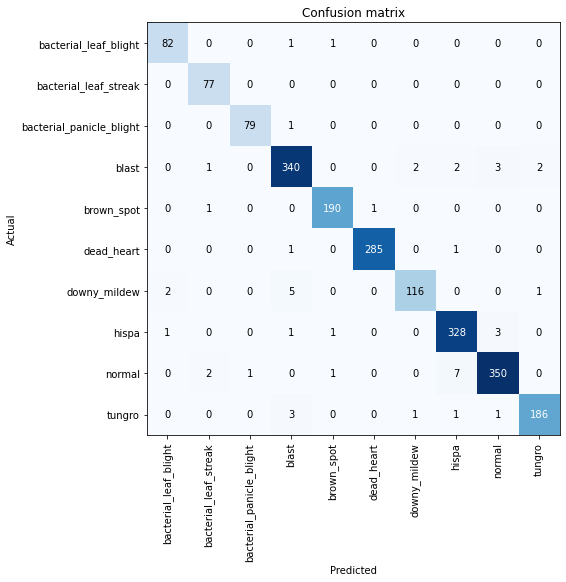

In [24]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

In [27]:
interp.print_classification_report()

                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.96      0.98      0.97        84
   bacterial_leaf_streak       0.95      1.00      0.97        77
bacterial_panicle_blight       0.99      0.99      0.99        80
                   blast       0.97      0.97      0.97       350
              brown_spot       0.98      0.99      0.99       192
              dead_heart       1.00      0.99      0.99       287
            downy_mildew       0.97      0.94      0.95       124
                   hispa       0.97      0.98      0.97       334
                  normal       0.98      0.97      0.97       361
                  tungro       0.98      0.97      0.98       192

                accuracy                           0.98      2081
               macro avg       0.98      0.98      0.98      2081
            weighted avg       0.98      0.98      0.98      2081



## Little Experiment

In [28]:
label = { r.image_id: r.label for _, r in train_df.iterrows() }

def bct_lf_blght_or_not(p):
    out = 'bct_lf_blght'
    if label[p.name] != 'bacterial_leaf_blight': out = 'not_bct_lf_blght'
    return out

In [29]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    n_inp = 1,    
    get_y = bct_lf_blght_or_not,
    get_items=get_image_files,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)

In [30]:
des = dblock.datasets(train_path)
des.vocab

['bct_lf_blght', 'not_bct_lf_blght']

In [32]:
bs = 64
dls = dblock.dataloaders(train_path, bs=bs)

In [33]:
cbs = GradientAccumulation(64)

learn = vision_learner(dls, resnet34, metrics=error_rate, cbs=cbs).to_fp16()

In [34]:
learn.fine_tune(20, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,0.425625,0.152223,0.045171,01:20


epoch,train_loss,valid_loss,error_rate,time
0,0.124179,0.067939,0.022105,01:31
1,0.071819,0.039436,0.011533,01:34
2,0.057643,0.044183,0.014897,01:26
3,0.078323,0.061982,0.020663,01:26
4,0.061029,0.019959,0.009130,01:30
5,0.052039,0.041309,0.012013,01:25
6,0.042423,0.034737,0.008650,01:26
7,0.033356,0.046381,0.011533,01:27
8,0.032163,0.034054,0.010091,01:25
9,0.027722,0.030048,0.008169,01:28


In [36]:
interp = ClassificationInterpretation.from_learner(learn)
interp.print_classification_report()

                  precision    recall  f1-score   support

    bct_lf_blght       1.00      0.93      0.96        84
not_bct_lf_blght       1.00      1.00      1.00      1997

        accuracy                           1.00      2081
       macro avg       1.00      0.96      0.98      2081
    weighted avg       1.00      1.00      1.00      2081



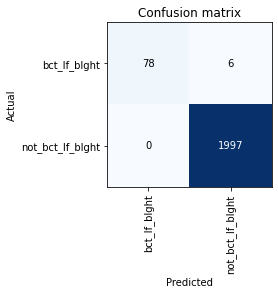

In [37]:
interp.plot_confusion_matrix(figsize=(4,4))

In [38]:
probs, _ = learn.get_preds(dl=dls.valid)

In [39]:
probs

TensorBase([[2.6070e-05, 9.9997e-01],
        [1.8266e-07, 1.0000e+00],
        [1.1772e-06, 1.0000e+00],
        ...,
        [9.8753e-01, 1.2468e-02],
        [7.2527e-07, 1.0000e+00],
        [4.9653e-07, 1.0000e+00]])

In [ ]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [47]:
F?

## Model 11. Resnet34 With Multitarget (disease, variety)

In [4]:
gc.collect()
torch.cuda.empty_cache()

In [8]:
def get_variety(p): 
    return train_df.loc[p.name, 'variety']

img2variety = { r.image_id: r.variety for _, r in train_df.iterrows() }

def get_variety(p): return img2variety[p.name]

In [9]:
dls = DataBlock(
    blocks=(ImageBlock,CategoryBlock,CategoryBlock),
    n_inp=1,
    get_items=get_image_files,
    get_y = [parent_label, get_variety],
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
).dataloaders(train_path)

In [7]:
def disease_loss(inp, disease, custom_labeling): return F.cross_entropy(inp[:, :10], disease)

def custom_labeling_loss(inp, disease, custom_labeling): return F.cross_entropy(inp[:, 10:], custom_labeling)

def combine_loss(inp, disease, custom_labeling): return disease_loss(inp, disease, custom_labeling) + custom_labeling_loss(inp, disease, custom_labeling)

def disease_err(inp, disease, custom_labeling): return error_rate(inp[:, :10], disease)

def custom_labeling_err(inp, disease, custom_labeling): return error_rate(inp[:, 10:], custom_labeling)

err_metrics = (disease_err, custom_labeling_err)

all_metrics = err_metrics + (disease_loss, custom_labeling_loss)

In [8]:
#learn = vision_learner(dls, resnet34, metrics=error_rate).to_fp16()
cbs = GradientAccumulation(64)

learn = vision_learner(
    dls, resnet34, 
    loss_func=combine_loss, metrics=all_metrics, n_out=20, 
    cbs=cbs
).to_fp16()

In [9]:
dls.vocab

(#2) [['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro'],['ADT45', 'AndraPonni', 'AtchayaPonni', 'IR20', 'KarnatakaPonni', 'Onthanel', 'Ponni', 'RR', 'Surya', 'Zonal']]

In [10]:
learn.fine_tune(60, 0.01)

epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,2.794418,1.455435,0.335896,0.153772,0.992517,0.462918,01:24


epoch,train_loss,valid_loss,disease_err,custom_labeling_err,disease_loss,custom_labeling_loss,time
0,1.040135,0.544822,0.121576,0.043729,0.398566,0.146255,01:21
1,0.583807,0.367353,0.078808,0.035560,0.250885,0.116468,01:18
2,0.410334,0.382296,0.072081,0.040846,0.257286,0.125010,01:19
3,0.344550,0.408969,0.081211,0.038924,0.273228,0.135741,01:17
4,0.318363,0.322313,0.069197,0.024988,0.237319,0.084994,01:17
5,0.316905,0.483958,0.072081,0.061509,0.264441,0.219518,01:17
6,0.343376,0.393473,0.076886,0.024988,0.309418,0.084056,01:17
7,0.335543,0.404292,0.086977,0.034118,0.295482,0.108810,01:17
8,0.366675,0.405733,0.072561,0.037001,0.278001,0.127731,01:19
9,0.354384,0.351818,0.083133,0.027871,0.265820,0.085998,01:18


In [11]:
probs, _ = learn.get_preds(dl=dls.test_dl(test_files))

In [12]:
preds, _ = learn.tta(dl=dls.test_dl(test_files))

In [13]:
sample_submission.label = dls.vocab[0][probs[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul10-model11-multi20resnet34-notta.csv', index=False)

sample_submission.label = dls.vocab[0][preds[:,:10].argmax(dim=1)]
sample_submission.to_csv('22jul10-model11-multi20resnet34-tta.csv', index=False)

In [17]:
preds, targs = learn.get_preds(dl=dls.test_dl(test_files))

In [20]:
print(targs)

None


## Model 12 - Resnet34 MixUp Foldi

In [4]:
from sklearn.model_selection import KFold

In [5]:
train_df['kfold'] = -1
# Number of Splits
n_folds=5
reversed = False

# For each label we are going to create n_folds folds
for label in train_df.label.unique():
    folds = list(range(n_folds))
    if reversed: folds.reverse()
    kf = KFold(n_splits=n_folds, random_state=42, shuffle=True)
    label_idxs = train_df[train_df.label==label].index
    kf.get_n_splits(label_idxs)
    for _, valid_index in kf.split(label_idxs):
        actual_fold = folds.pop(0)
        df_index = label_idxs[valid_index]
        train_df.loc[df_index, 'kfold'] = actual_fold
    reversed = not reversed

In [6]:
df = train_df.groupby(['label', 'kfold']).size().reset_index()
df.columns = ['label', 'kfold', 'count']
#df.kfold = df.kfold.astype('str')

fig = px.bar(
    df, x="kfold", y="count",
    color='label', barmode='group',
    height=400
)
fig.show()

In [7]:
img2valid = []
for fold in range(n_folds):
    train_df['is_valid'] = False
    idxs = train_df[train_df.kfold == fold].index
    train_df.loc[idxs, 'is_valid'] = True
    img2valid.append({ r.image_id: r.is_valid for _, r in train_df.iterrows() })

In [8]:
def custom_loss(inp, disease): 
    return F.cross_entropy(inp, disease, label_smoothing=label_smoothing)

In [9]:
def get_datablock(i_fold, size, item_tfms, accum):
    def get_split(p): return img2valid[i_fold][p.name]
    
    dblock = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items=get_image_files,
        get_y=parent_label,
        # Custom Splitter
        splitter = FuncSplitter(get_split),
        item_tfms=item_tfms,
        batch_tfms=aug_transforms(size=size, min_scale=0.75)
    )
    return dblock.dataloaders(train_path, bs=64//accum)

In [10]:
def train(i_fold, arch, size=224, item_tfms=Resize(480, method='squish'), 
          accum=1, epochs=16, lr=0.005, loss_func=None, label_smth=0,
         mixup_alpha=None):
    
    dls = get_datablock(i_fold=i_fold, size=size, item_tfms=item_tfms, accum=accum)
    print('- First 5 validation images:')
    print([each.name for each in dls.valid.items[:5]])
    
    cbs = [GradientAccumulation(64)] if accum!=1 else []
    if mixup_alpha: cbs += [MixUp(mixup_alpha)]
    
    try: arch = eval(arch) 
    except: arch = arch
    print(arch)
            
    #learn = vision_learner(dls, arch, metrics=error_rate, cbs=cbs).to_fp16()
    global label_smoothing
    label_smoothing = label_smth
    learn = vision_learner(dls, arch, metrics=error_rate, loss_func=loss_func, cbs=cbs).to_fp16()
    print(learn.cbs)
    
    print('- Fine Tuning')
    learn.fine_tune(epochs, lr)
    print('- Getting predictions')
    probs, _ = learn.get_preds(dl=dls.test_dl(test_files))
    #probs = None # Return only tta_preds
    print('- Getting tta_predictions')
    preds, _ = learn.tta(dl=dls.test_dl(test_files))
    #preds = None
    
    return probs, preds, dls.vocab

In [11]:
# No he logrado ejecutar MixUp junto con custom_loss
# Se colocó loss_func=LabelSmoothingCrossEntropy(eps=0), eps=0 => no label smoothing
preds, tta_preds, vocab = train(
    i_fold=4, arch='resnet34', size=224, item_tfms=Resize(480, method='squish'), 
    accum=1, epochs=36, lr=0.005, loss_func=LabelSmoothingCrossEntropy(eps=0), label_smth=0,
    mixup_alpha=0.4
)

- First 5 validation images:
['100126.jpg', '100365.jpg', '100635.jpg', '100649.jpg', '100681.jpg']
<function resnet34 at 0x7f511bfe3b80>
[TrainEvalCallback, Recorder, ProgressCallback, MixUp, MixedPrecision]
- Fine Tuning


epoch,train_loss,valid_loss,error_rate,time
0,2.183459,1.144572,0.380586,01:15


epoch,train_loss,valid_loss,error_rate,time
0,1.404692,0.583892,0.178280,01:17
1,1.120975,0.427019,0.130226,01:16
2,1.020720,0.344585,0.100913,01:15
3,0.943653,0.308017,0.093705,01:18
4,0.900811,0.269098,0.070639,01:17
5,0.867307,0.335779,0.097549,01:19
6,0.850528,0.309498,0.089861,01:17
7,0.854265,0.299409,0.080730,01:16
8,0.831748,0.305020,0.094185,01:15
9,0.833648,0.320161,0.084575,01:16


- Getting predictions


- Getting tta_predictions


In [15]:
vocab[preds.argmax(dim=1)]

(#3469) ['hispa','normal','blast','blast','blast','brown_spot','dead_heart','brown_spot','hispa','normal'...]

In [16]:
sample_submission.label = vocab[preds.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12-mixup-fold4-resnet34-notta.csv', index=False)

sample_submission.label = vocab[tta_preds.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12-mixup-fold4-resnet34-tta.csv', index=False)

In [19]:
preds[0]

TensorBase([3.8588e-05, 1.2073e-04, 3.4998e-05, 3.1871e-04, 2.5709e-04, 7.1752e-04,
        1.1188e-04, 9.9759e-01, 7.5085e-04, 5.6255e-05])

#### A pedal y bomba para correr MixUp

In [13]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480, method='squish'),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)

dls = dblock.dataloaders(train_path, bs=64)

cbs = [MixUp(0.4)]
learn = vision_learner(dls, resnet34, metrics=error_rate, 
                       loss_func=LabelSmoothingCrossEntropy(eps=0), cbs=cbs).to_fp16()

In [33]:
learn.fine_tune(1, .005)

epoch,train_loss,valid_loss,error_rate,time
0,2.186515,1.158752,0.378664,01:11


epoch,train_loss,valid_loss,error_rate,time
0,1.289589,0.560174,0.170591,01:20


### Model 12b - Labelsmoothing Foldi

In [20]:
# mixup_alpha=None => no se aplica MixUp
# eps = 0.1 => se aplica label smoothing

preds2, tta_preds2, vocab = train(
    i_fold=4, arch='resnet34', size=224, item_tfms=Resize(480, method='squish'), 
    accum=1, epochs=36, lr=0.005, loss_func=LabelSmoothingCrossEntropy(eps=0.1), label_smth=0,
    mixup_alpha=None
)

- First 5 validation images:
['100126.jpg', '100365.jpg', '100635.jpg', '100649.jpg', '100681.jpg']
<function resnet34 at 0x7f511bfe3b80>
[TrainEvalCallback, Recorder, ProgressCallback, MixedPrecision]
- Fine Tuning


epoch,train_loss,valid_loss,error_rate,time
0,2.010248,1.393384,0.353676,01:09


epoch,train_loss,valid_loss,error_rate,time
0,1.184596,0.915579,0.147525,01:18
1,0.950060,0.807911,0.095627,01:17
2,0.824279,0.742028,0.071600,01:19
3,0.762151,0.730377,0.066314,01:17
4,0.705423,0.730258,0.068717,01:18
5,0.693873,0.740899,0.073522,01:20
6,0.685087,0.789306,0.089861,01:17
7,0.677276,0.713613,0.070159,01:18
8,0.678940,0.726485,0.074483,01:16
9,0.655280,0.675253,0.057665,01:17


- Getting predictions


- Getting tta_predictions


In [22]:
sample_submission.label = vocab[preds2.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12b-lblsmth-fold4-resnet34-notta.csv', index=False)

sample_submission.label = vocab[tta_preds2.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12b-lblsmth-fold4-resnet34-tta.csv', index=False)

### 12c - Plain 36 epochs

In [23]:
# No mixup
# No label smoothing

preds3, tta_preds3, vocab = train(
    i_fold=4, arch='resnet34', size=224, item_tfms=Resize(480, method='squish'), 
    accum=1, epochs=36, lr=0.005, loss_func=None, label_smth=0,
    mixup_alpha=None
)

- First 5 validation images:
['100126.jpg', '100365.jpg', '100635.jpg', '100649.jpg', '100681.jpg']
<function resnet34 at 0x7f511bfe3b80>
[TrainEvalCallback, Recorder, ProgressCallback, MixedPrecision]
- Fine Tuning


epoch,train_loss,valid_loss,error_rate,time
0,1.764874,1.047688,0.336377,01:16


epoch,train_loss,valid_loss,error_rate,time
0,0.798088,0.472410,0.153292,01:20
1,0.436901,0.303920,0.097069,01:22
2,0.317390,0.263550,0.081691,01:29
3,0.246907,0.276204,0.073522,01:20
4,0.238284,0.304547,0.088900,01:19
5,0.247660,0.292030,0.081691,01:20
6,0.228533,0.296756,0.081691,01:18
7,0.253773,0.345924,0.090822,01:20
8,0.245513,0.256220,0.080250,01:22
9,0.216582,0.268575,0.070639,01:21


- Getting predictions


- Getting tta_predictions


In [24]:
sample_submission.label = vocab[preds3.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12c-fold4-resnet34-notta.csv', index=False)

sample_submission.label = vocab[tta_preds3.argmax(dim=1)]
sample_submission.to_csv('22jul22-modl12c-fold4-resnet34-tta.csv', index=False)

In [27]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480),
    batch_tfms=aug_transforms(size=224, min_scale=0.75)
)
dls = dblock.dataloaders(train_path)

In [28]:
learn = vision_learner(dls, resnet34, metrics=error_rate).to_fp16()

In [29]:
learn.fine_tune(16, 0.005)

epoch,train_loss,valid_loss,error_rate,time
0,1.825737,1.088658,0.338779,02:47


epoch,train_loss,valid_loss,error_rate,time
0,0.848430,0.503332,0.159058,03:22
1,0.550576,0.338444,0.105238,03:22
2,0.429191,0.346120,0.105718,03:06
3,0.398357,0.459607,0.126382,03:30
4,0.389500,0.304438,0.088419,03:24
5,0.300036,0.342419,0.098991,03:27
6,0.257501,0.258648,0.075925,03:35
7,0.205420,0.197314,0.056223,03:32
8,0.170715,0.190119,0.050937,03:23
9,0.150313,0.178741,0.049495,03:19


In [30]:
export_name = '220628-224-resnet34-16epochs-lr005'
learn.export('model' + export_name + '.pkl')

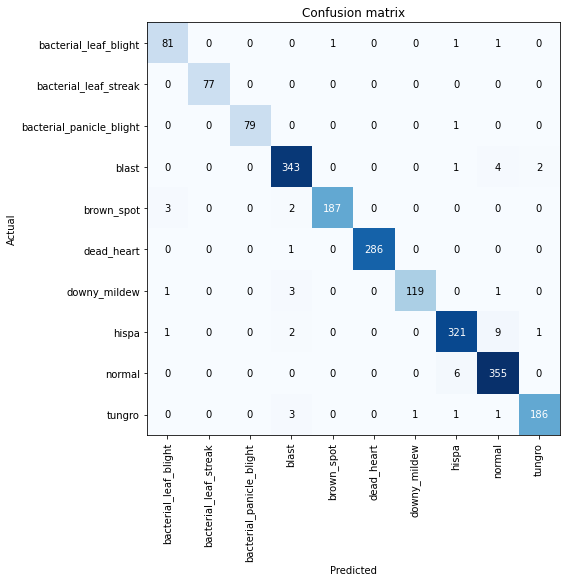

In [31]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

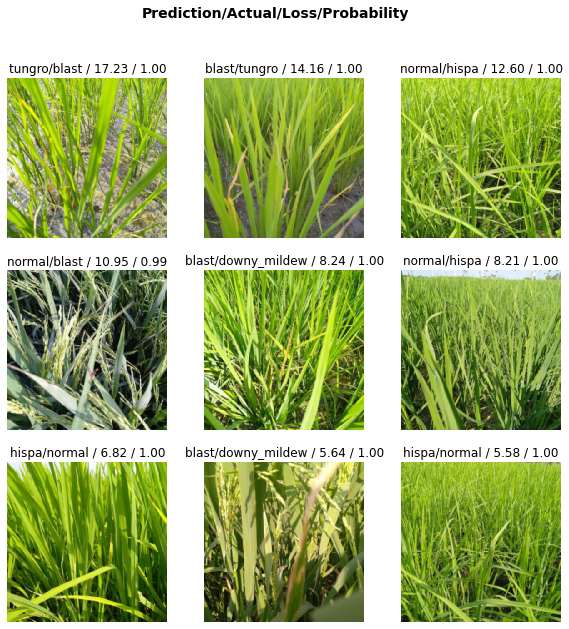

In [32]:
interp.plot_top_losses(9, figsize=(10,10))

In [33]:
valid = learn.dls.valid
preds, targs = learn.get_preds(dl=valid)
error_rate(preds, targs)

TensorBase(0.0226)

In [58]:
tta_preds, targs = learn.tta(dl=learn.dls.valid)
error_rate(tta_preds, targs)

TensorBase(0.0226)

In [61]:
tta_preds

TensorBase([4.6363e-05, 7.5950e-06, 6.7334e-05, 3.1071e-04, 6.8944e-04, 6.5688e-04,
        1.4183e-04, 5.6466e-02, 9.4148e-01, 1.3724e-04])

In [36]:
interp.print_classification_report()

                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.94      0.96      0.95        84
   bacterial_leaf_streak       1.00      1.00      1.00        77
bacterial_panicle_blight       1.00      0.99      0.99        80
                   blast       0.97      0.98      0.97       350
              brown_spot       0.99      0.97      0.98       192
              dead_heart       1.00      1.00      1.00       287
            downy_mildew       0.99      0.96      0.98       124
                   hispa       0.97      0.96      0.97       334
                  normal       0.96      0.98      0.97       361
                  tungro       0.98      0.97      0.98       192

                accuracy                           0.98      2081
               macro avg       0.98      0.98      0.98      2081
            weighted avg       0.98      0.98      0.98      2081



In [38]:
targs

TensorCategory([7, 8, 1,  ..., 0, 9, 4])

In [42]:
preds[1].argmax()

TensorBase(8)

In [44]:
interp.top_losses()[0]

TensorBase([17.2280, 14.1622, 12.5971,  ..., -0.0000, -0.0000, -0.0000])

In [45]:
interp.top_losses()[1]

TensorBase([1123,  638,   79,  ...,  523,  991, 1621])

In [46]:
learn.dls.valid.items[interp.top_losses()[1][0]]

Path('paddy-disease-classification/train_images/blast/102592.jpg')

Preds on Test

In [50]:
test_dl = dls.test_dl(test_files)

In [51]:
probs, _, idxs = learn.get_preds(dl=test_dl, with_decoded=True)
idxs

TensorBase([7, 8, 3,  ..., 8, 1, 5])

First Way

In [52]:
mapping = dict(enumerate(dls.vocab))
results = pd.Series(idxs.numpy(), name="idxs").map(mapping)
results

0                       hispa
1                      normal
2                       blast
3                       blast
4                       blast
                ...          
3464               dead_heart
3465                    hispa
3466                   normal
3467    bacterial_leaf_streak
3468               dead_heart
Name: idxs, Length: 3469, dtype: object

In [53]:
learn.get_preds??

Second Way

In [56]:
tta_preds,_ = learn.tta(dl=test_dl)

In [57]:
tta_idxs = tta_preds.argmax(dim=1)
vocab = np.array(learn.dls.vocab)
results = pd.Series(vocab[tta_idxs], name="tta_idxs")
results

0                       hispa
1                      normal
2                       blast
3                       blast
4                       blast
                ...          
3464               dead_heart
3465                    hispa
3466                   normal
3467    bacterial_leaf_streak
3468               dead_heart
Name: tta_idxs, Length: 3469, dtype: object

In [64]:
sample_submission['label_1'] = results

## Scale

In [65]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480),
    batch_tfms=aug_transforms(size=360, min_scale=0.75)
)
dls = dblock.dataloaders(train_path)

In [66]:
learn.dls = dls

In [67]:
learn.fine_tune(16, 0.0075)

epoch,train_loss,valid_loss,error_rate,time
0,0.133870,0.241836,0.058626,05:56


epoch,train_loss,valid_loss,error_rate,time
0,0.118508,0.149617,0.041326,06:10
1,0.169719,0.189750,0.055742,07:23
2,0.201168,0.425269,0.100432,03:10
3,0.266263,0.236852,0.063431,07:01
4,0.276505,0.258396,0.088419,07:14
5,0.221659,0.521938,0.139837,06:55
6,0.194693,0.308058,0.089861,07:10
7,0.175244,0.210472,0.060067,07:12
8,0.145650,0.402383,0.098030,07:05
9,0.100568,0.152326,0.043248,07:04


In [68]:
export_name = '220628-360-resnet34-16epochs-lr005'
learn.export('model' + export_name + '.pkl')

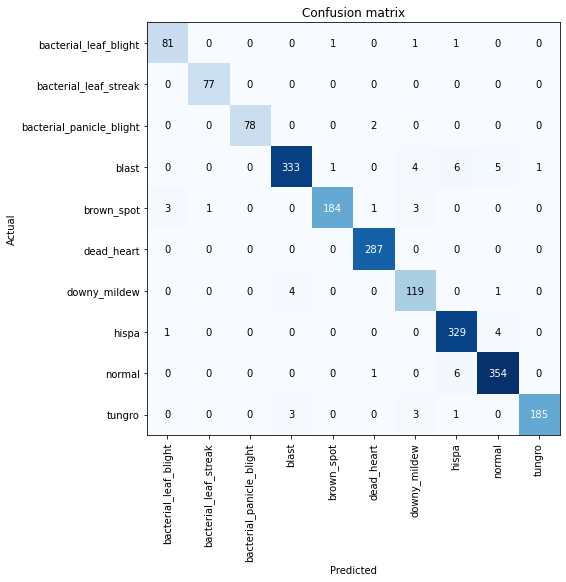

In [69]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

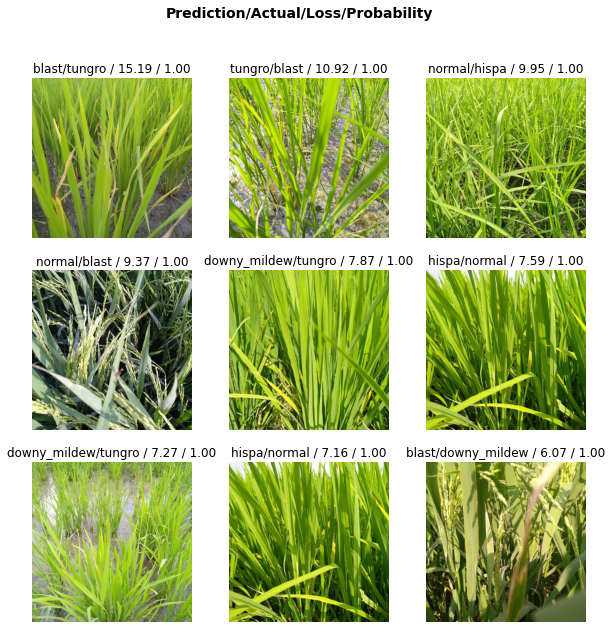

In [70]:
interp.plot_top_losses(9, figsize=(10,10))

In [71]:
tta_preds,_ = learn.tta(dl=test_dl)

In [72]:
tta_idxs = tta_preds.argmax(dim=1)
vocab = np.array(learn.dls.vocab)
results = pd.Series(vocab[tta_idxs], name="tta_idxs")
results

0       dead_heart
1       dead_heart
2       dead_heart
3       dead_heart
4           normal
           ...    
3464    dead_heart
3465    dead_heart
3466    dead_heart
3467         blast
3468    dead_heart
Name: tta_idxs, Length: 3469, dtype: object

Pareciera que hay un error aquí con tantos dead_heart ... 

In [73]:
sample_submission['label_2'] = results

In [74]:
csv_file = 'subm_2_tta.csv'

sample_submission.to_csv(csv_file, index=False)

In [75]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(0.2, seed=42),
    item_tfms=Resize(480),
    batch_tfms=aug_transforms(size=480, min_scale=0.75)
)
dls = dblock.dataloaders(train_path)

In [76]:
learn.dls = dls

In [77]:
learn.fine_tune(16, 0.01)

epoch,train_loss,valid_loss,error_rate,time
0,0.047583,0.266715,0.043248,07:30


epoch,train_loss,valid_loss,error_rate,time
0,0.074276,0.281459,0.061509,11:43
1,0.122878,0.565434,0.103316,11:14
2,0.175548,0.663720,0.167708,11:06
3,0.241939,0.558628,0.152811,11:02
4,0.218730,0.272342,0.071120,11:08
5,0.190097,0.444749,0.125901,11:04
6,0.199968,0.278733,0.085055,11:04
7,0.128341,0.370707,0.095147,11:05
8,0.098577,0.266208,0.070639,11:04
9,0.080928,0.215188,0.053820,11:04


In [78]:
export_name = '220628-480-resnet34-16epochs-lr01'
learn.export('model' + export_name + '.pkl')

In [79]:
tta_preds, targs = learn.tta(dl=learn.dls.valid)
error_rate(tta_preds, targs)

TensorBase(0.0211)

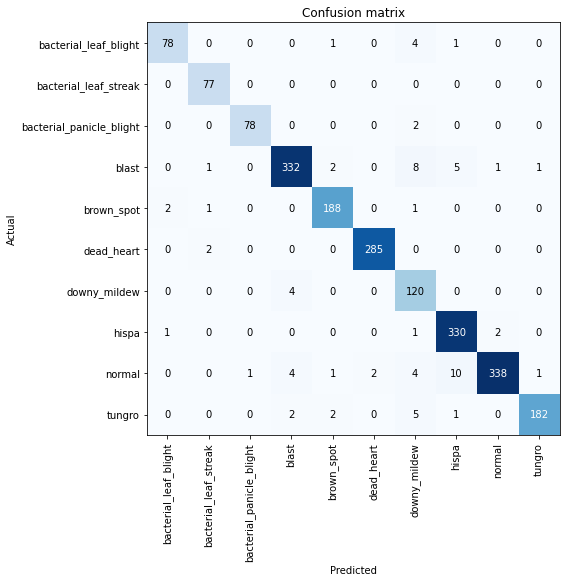

In [80]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

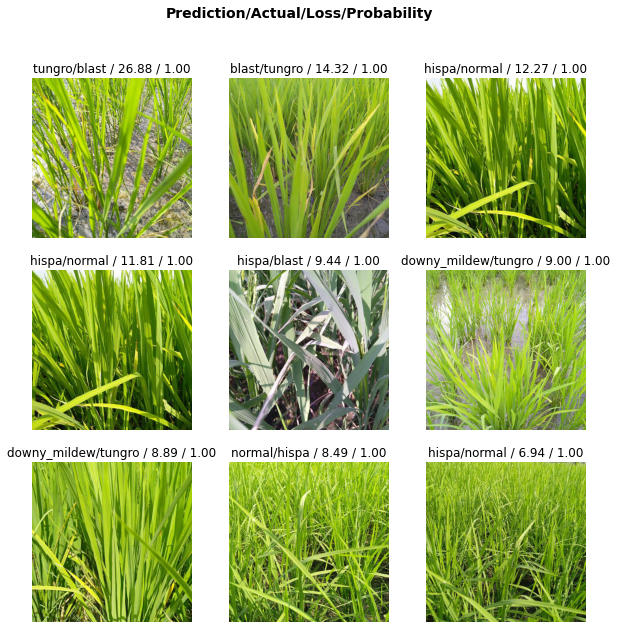

In [81]:
interp.plot_top_losses(9, figsize=(10,10))

In [82]:
tta_preds,_ = learn.tta(dl=test_dl)

In [83]:
tta_idxs = tta_preds.argmax(dim=1)
vocab = np.array(learn.dls.vocab)
results = pd.Series(vocab[tta_idxs], name="tta_idxs")
results

0       dead_heart
1           normal
2       dead_heart
3       brown_spot
4           normal
           ...    
3464        tungro
3465        tungro
3466        tungro
3467    brown_spot
3468    dead_heart
Name: tta_idxs, Length: 3469, dtype: object

In [84]:
sample_submission['label_3'] = results

In [85]:
csv_file = 'subm_3_tta.csv'

sample_submission.to_csv(csv_file, index=False)